Data Reads

In [1]:
# Imports
import os
import numpy as np
import pandas as pd
import sqlite3 as sq3
import pandas.io.sql as pds

In [2]:
# Create connection to SQLite databse
path = 'data/classic_rock.db'
con = sq3.Connection(path)

In [3]:
query = '''
select
*
from rock_songs
;
'''

results = pds.read_sql(query,con)
results.head()

,Song,Artist,Release_Year,PlayCount
0,Caught Up in You,.38 Special,1982.0,82
1,Hold On Loosely,.38 Special,1981.0,85
2,Rockin' Into the Night,.38 Special,1980.0,18
3,Art For Arts Sake,10cc,1975.0,1
4,Kryptonite,3 Doors Down,2000.0,13


In [4]:
filepath = "data/Ames_Housing_Data.tsv"
data = pd.read_csv(filepath,sep='\t')
data = data.loc[data['Gr Liv Area'] <= 4000,:]  #remove outliers per dataset author
print("#rows in data:", data.shape[0])
print("#cols in data:", data.shape[1])

#rows in data: 2925
#cols in data: 82


In [5]:
data.head().T

,0,1,2,3,4
Order,1,2,3,4,5
PID,526301100,526350040,526351010,526353030,527105010
MS SubClass,20,20,20,20,60
MS Zoning,RL,RH,RL,RL,RL
Lot Frontage,141.0,80.0,81.0,93.0,74.0
...,...,...,...,...,...
Mo Sold,5,6,6,4,3
Yr Sold,2010,2010,2010,2010,2010
Sale Type,WD,WD,WD,WD,WD
Sale Condition,Normal,Normal,Normal,Normal,Normal


In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Order,2925.0,1.464795e+03,8.464417e+02,1.0,7.320000e+02,1463.0,2.199000e+03,2.930000e+03
PID,2925.0,7.143931e+08,1.887274e+08,526301100.0,5.284770e+08,535453210.0,9.071801e+08,1.007100e+09
MS SubClass,2925.0,5.739658e+01,4.266875e+01,20.0,2.000000e+01,50.0,7.000000e+01,1.900000e+02
Lot Frontage,2435.0,6.902382e+01,2.271092e+01,21.0,5.800000e+01,68.0,8.000000e+01,3.130000e+02
Lot Area,2925.0,1.010358e+04,7.781999e+03,1300.0,7.438000e+03,9428.0,1.151500e+04,2.152450e+05
Overall Qual,2925.0,6.088205e+00,1.402953e+00,1.0,5.000000e+00,6.0,7.000000e+00,1.000000e+01
Overall Cond,2925.0,5.563761e+00,1.112262e+00,1.0,5.000000e+00,5.0,6.000000e+00,9.000000e+00
Year Built,2925.0,1.971303e+03,3.024247e+01,1872.0,1.954000e+03,1973.0,2.001000e+03,2.010000e+03
Year Remod/Add,2925.0,1.984234e+03,2.086177e+01,1950.0,1.965000e+03,1993.0,2.004000e+03,2.010000e+03
Mas Vnr Area,2902.0,1.007105e+02,1.760343e+02,0.0,0.000000e+00,0.0,1.640000e+02,1.600000e+03


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2925 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2925 non-null   int64  
 1   PID              2925 non-null   int64  
 2   MS SubClass      2925 non-null   int64  
 3   MS Zoning        2925 non-null   object 
 4   Lot Frontage     2435 non-null   float64
 5   Lot Area         2925 non-null   int64  
 6   Street           2925 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2925 non-null   object 
 9   Land Contour     2925 non-null   object 
 10  Utilities        2925 non-null   object 
 11  Lot Config       2925 non-null   object 
 12  Land Slope       2925 non-null   object 
 13  Neighborhood     2925 non-null   object 
 14  Condition 1      2925 non-null   object 
 15  Condition 2      2925 non-null   object 
 16  Bldg Type        2925 non-null   object 
 17  House Style   

In [8]:
data['Sale Type'].value_counts()

WD       2534
New       236
COD        87
ConLD      26
CWD        12
ConLI       9
ConLw       8
Oth         7
Con         5
VWD         1
Name: Sale Type, dtype: int64

In [9]:
data.groupby('Sale Type').agg(['mean', 'median', 'min', 'max'])

Order                               PID               \
                  mean  median   min   max          mean       median   
Sale Type                                                               
COD        1290.126437  1189.0    21  2879  7.006444e+08  535402180.0   
CWD        1934.416667  1951.5  1172  2225  7.199654e+08  718814040.0   
Con         985.800000  1181.0    69  2140  7.552983e+08  902128150.0   
ConLD      1277.038462  1256.5    96  2844  7.934564e+08  903891635.0   
ConLI      1207.333333   725.0    28  2698  6.958263e+08  532351090.0   
ConLw      1307.375000  1128.5   303  2663  8.577821e+08  903328165.0   
New        1783.707627  1799.5    18  2903  6.207485e+08  528427070.0   
Oth        1202.285714   708.0   126  2361  7.476269e+08  902204080.0   
VWD        2070.000000  2070.0  2070  2070  9.052262e+08  905226170.0   
WD         1443.635359  1414.5     1  2930  7.221144e+08  902104535.0   

                                 MS SubClass         ... Mo Sold      \
                 min         max        mean median  ...     min max   
Sale Type                                            ...               
COD        527182110   923251160   47.758621   20.0  ...       1  12   
CWD        528181070   909428340   58.333333   55.0  ...       1  10   
Con        528458070   907202220   82.000000   60.0  ...       1   9   
ConLD      528427010   923230190   80.000000   55.0  ...       2  12   
ConLI      527425090   909101010   47.777778   50.0  ...       3  12   
ConLw      528253010   910203250   58.125000   50.0  ...       1  10   
New        527108010   923202134   51.398305   60.0  ...       1  12   
Oth        527402380   923400150   41.428571   20.0  ...       1  11   
VWD        905226170   905226170   20.000000   20.0  ...      10  10   
WD         526301100  1007100110   58.091949   50.0  ...       1  12   

               Yr Sold                          SalePrice                    \
                  mean  median   min   max           mean    median     min   
Sale Type                                                                     
COD        2008.068966  2008.0  2006  2010  132248.287356  127500.0   50000   
CWD        2007.083333  2007.0  2007  2008  184237.500000  160750.0  135000   
Con        2008.600000  2008.0  2007  2010  224446.000000  215200.0  120000   
ConLD      2008.230769  2008.0  2006  2010  125748.192308  127500.0   35000   
ConLI      2008.111111  2009.0  2006  2010  180105.555556  119000.0   75000   
ConLw      2008.125000  2008.5  2006  2010  121937.500000   92500.0   60000   
New        2007.122881  2007.0  2006  2010  277016.792373  252339.0  113000   
Oth        2008.285714  2009.0  2006  2010  114920.142857  116050.0   80000   
VWD        2007.000000  2007.0  2007  2007  137000.000000  137000.0  137000   
WD         2007.838200  2008.0  2006  2010  173907.603788  157000.0   12789   

                   
              max  
Sale Type          
COD        287000  
CWD        328900  
Con        324000  
ConLD      235128  
ConLI      451950  
ConLw      212000  
New        611657  
Oth        155891  
VWD        137000  
WD         625000  

[10 rows x 156 columns]

Exploratory Plots

In [10]:
data.columns.tolist()

['Order',
 'PID',
 'MS SubClass',
 'MS Zoning',
 'Lot Frontage',
 'Lot Area',
 'Street',
 'Alley',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Overall Qual',
 'Overall Cond',
 'Year Built',
 'Year Remod/Add',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Mas Vnr Type',
 'Mas Vnr Area',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin SF 1',
 'BsmtFin Type 2',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Full Bath',
 'Half Bath',
 'Bedroom AbvGr',
 'Kitchen AbvGr',
 'Kitchen Qual',
 'TotRms AbvGrd',
 'Functional',
 'Fireplaces',
 'Fireplace Qu',
 'Garage Type',
 'Garage Yr Blt',
 'Garage Finish',
 'Garage Cars',
 'Garage 

Focused Data Scope

In [11]:
keydata = data.loc[:,['Lot Area', 'Neighborhood', 'House Style', 
                      'Overall Qual', 'Overall Cond', 'Year Built',
                      'Year Remod/Add', 'Bedroom AbvGr', 'Lot Frontage',
                      'TotRms AbvGrd', 'Garage Type', 'Garage Area',
                      'Garage Cars', 'Mas Vnr Area', 
                      'Mo Sold', 'Yr Sold', 'Sale Type',
                      'Sale Condition', 'SalePrice']]
keydata.describe().T

,count,mean,std,min,25%,50%,75%,max
Lot Area,2925.0,10103.583590,7781.999124,1300.0,7438.0,9428.0,11515.0,215245.0
Overall Qual,2925.0,6.088205,1.402953,1.0,5.0,6.0,7.0,10.0
Overall Cond,2925.0,5.563761,1.112262,1.0,5.0,5.0,6.0,9.0
Year Built,2925.0,1971.302906,30.242474,1872.0,1954.0,1973.0,2001.0,2010.0
Year Remod/Add,2925.0,1984.234188,20.861774,1950.0,1965.0,1993.0,2004.0,2010.0
Bedroom AbvGr,2925.0,2.853675,0.827737,0.0,2.0,3.0,3.0,8.0
Lot Frontage,2435.0,69.023819,22.710918,21.0,58.0,68.0,80.0,313.0
TotRms AbvGrd,2925.0,6.434188,1.557887,2.0,5.0,6.0,7.0,14.0
Garage Area,2924.0,471.883721,213.816049,0.0,320.0,480.0,576.0,1488.0
Garage Cars,2924.0,1.765048,0.759834,0.0,1.0,2.0,2.0,5.0


In [12]:
keydata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2925 entries, 0 to 2929
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Lot Area        2925 non-null   int64  
 1   Neighborhood    2925 non-null   object 
 2   House Style     2925 non-null   object 
 3   Overall Qual    2925 non-null   int64  
 4   Overall Cond    2925 non-null   int64  
 5   Year Built      2925 non-null   int64  
 6   Year Remod/Add  2925 non-null   int64  
 7   Bedroom AbvGr   2925 non-null   int64  
 8   Lot Frontage    2435 non-null   float64
 9   TotRms AbvGrd   2925 non-null   int64  
 10  Garage Type     2768 non-null   object 
 11  Garage Area     2924 non-null   float64
 12  Garage Cars     2924 non-null   float64
 13  Mas Vnr Area    2902 non-null   float64
 14  Mo Sold         2925 non-null   int64  
 15  Yr Sold         2925 non-null   int64  
 16  Sale Type       2925 non-null   object 
 17  Sale Condition  2925 non-null   o

In [13]:
keydata['Garage Type'].value_counts()

Attchd     1727
Detchd      782
BuiltIn     185
Basment      36
2Types       23
CarPort      15
Name: Garage Type, dtype: int64

Data Cleaning & Feature Engineering

In [14]:
labdata = keydata.copy()
labdata['Garage Type'] = labdata['Garage Type'].fillna("Unkwn")
for feature in ['Garage Cars','Garage Area']:
    labdata[feature] = labdata[feature].fillna(0)

In [15]:
style_counts = labdata['House Style'].value_counts()
other_styles = list(style_counts[style_counts < 100].index)
labdata['House Style'] = keydata['House Style'].replace(other_styles,'Other')
labdata['House Style'].value_counts()

1Story    1480
2Story     869
1.5Fin     314
Other      134
SLvl       128
Name: House Style, dtype: int64

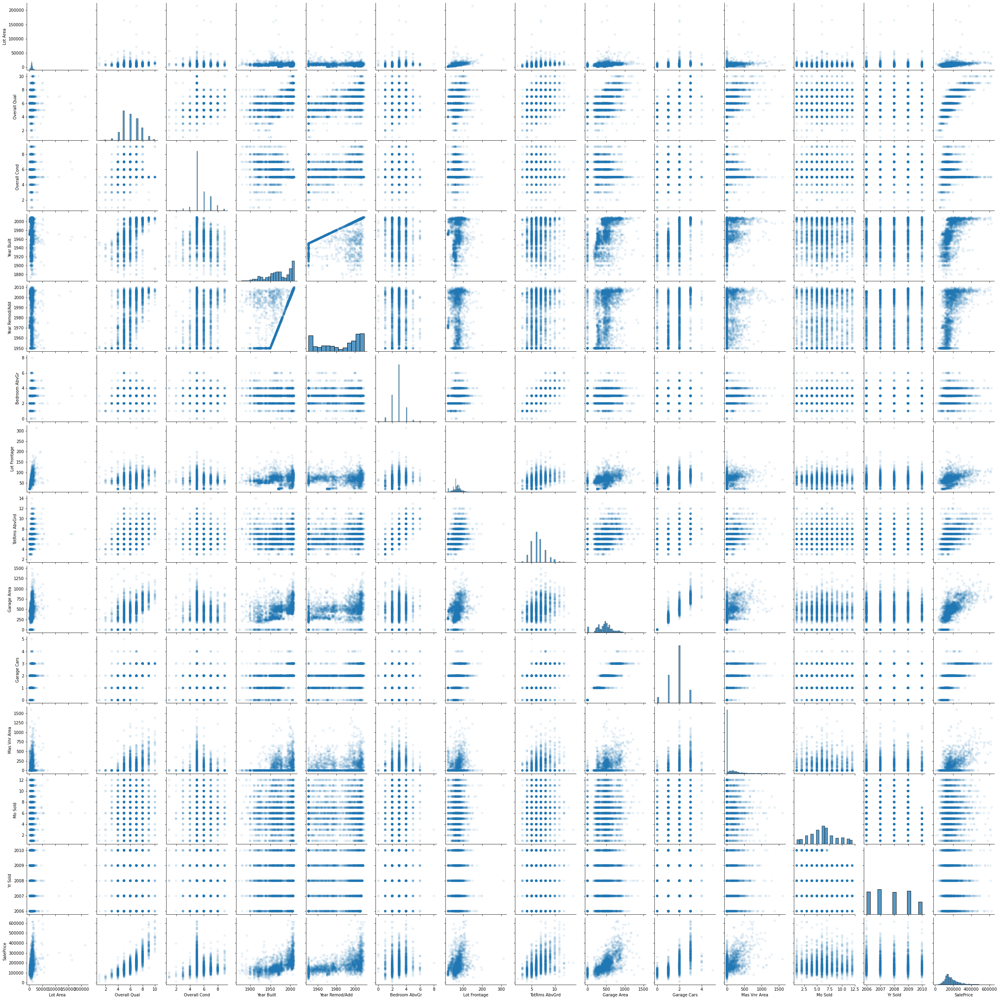

In [16]:
import seaborn as sns

sns.pairplot(labdata, plot_kws=dict(alpha=0.1, edgecolor='none'))

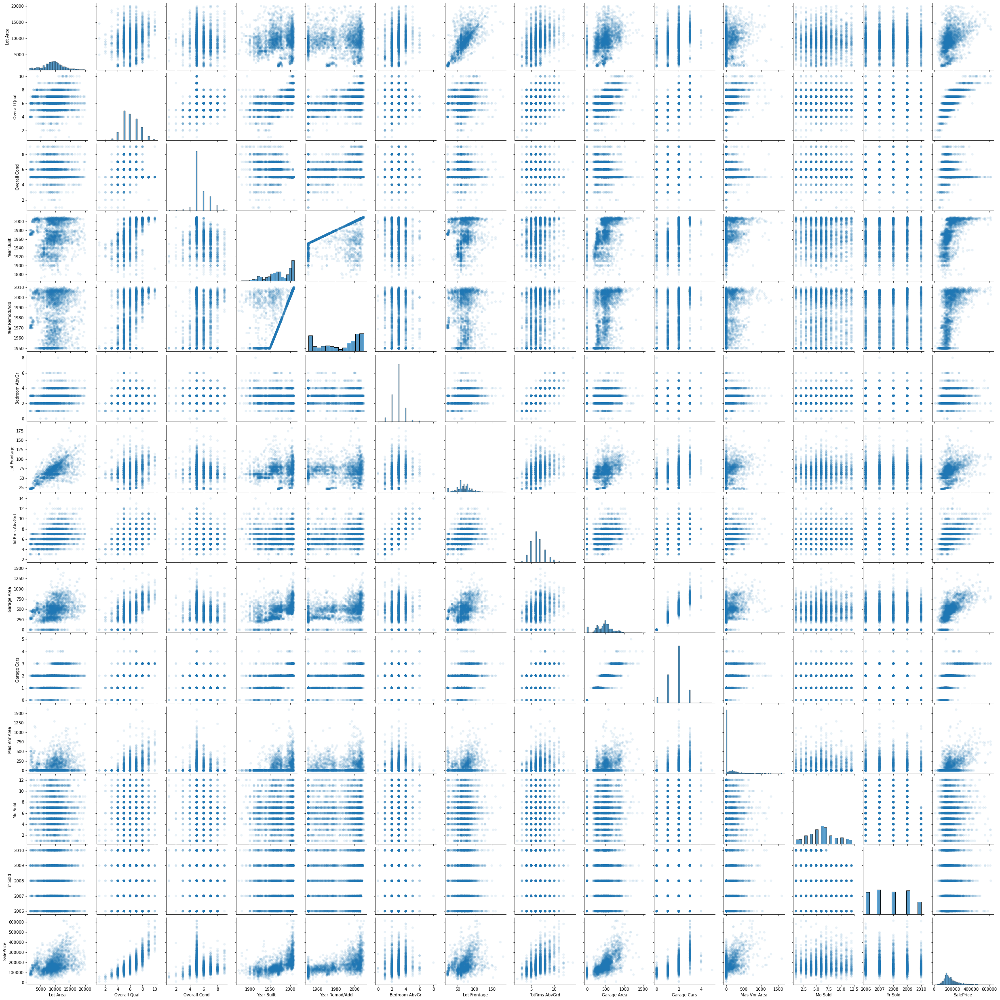

In [17]:
labdata = labdata.loc[labdata['Lot Area'] <= 20000, :]
sns.pairplot(labdata, plot_kws=dict(alpha=0.1, edgecolor='none'))

In [18]:
if_float = labdata.dtypes == np.float
float_cols = labdata.columns[if_float]

skew_limit = 0.75
skew_vals = labdata[float_cols].skew()

skew_cols = (skew_vals
            .to_frame()
            .rename(columns={0:'Skew'})
            .query('abs(Skew) > {}'.format(skew_limit)))
skew_cols

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/4224822686.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if_float = labdata.dtypes == np.float


,Skew
Mas Vnr Area,2.50462


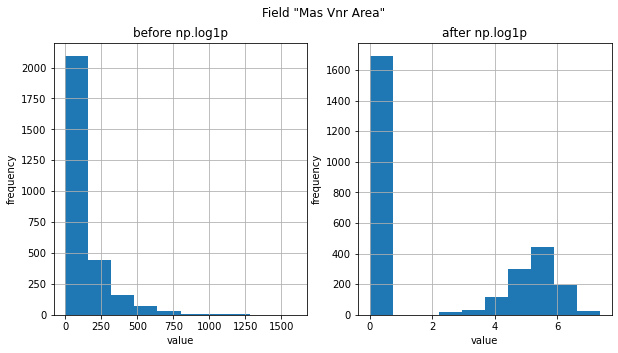

In [19]:
import matplotlib.pyplot as plt

field = "Mas Vnr Area"
fig, (ax_before, ax_after) = plt.subplots(1,2,figsize=(10,5))
labdata[field].hist(ax=ax_before)
labdata[field].apply(np.log1p).hist(ax=ax_after)

ax_before.set(title='before np.log1p',ylabel='frequency',xlabel='value')
ax_after.set(title='after np.log1p',ylabel='frequency',xlabel='value')
fig.suptitle('Field "{}"'.format(field));

In [20]:
# Bulk skew transformation
for col in skew_cols.index.values:
    if col == 'SalePrice':
        continue
    labdata[col] = labdata[col].apply(np.log1p)

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/3314174456.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labdata[col] = labdata[col].apply(np.log1p)


In [21]:
labdata.shape

(2839, 19)

In [22]:
labdata.isnull().sum().sort_values()

Lot Area            0
Sale Type           0
Yr Sold             0
Mo Sold             0
Garage Cars         0
Garage Area         0
Garage Type         0
Sale Condition      0
TotRms AbvGrd       0
Bedroom AbvGr       0
Year Remod/Add      0
Year Built          0
Overall Cond        0
Overall Qual        0
House Style         0
Neighborhood        0
SalePrice           0
Mas Vnr Area       22
Lot Frontage      455
dtype: int64

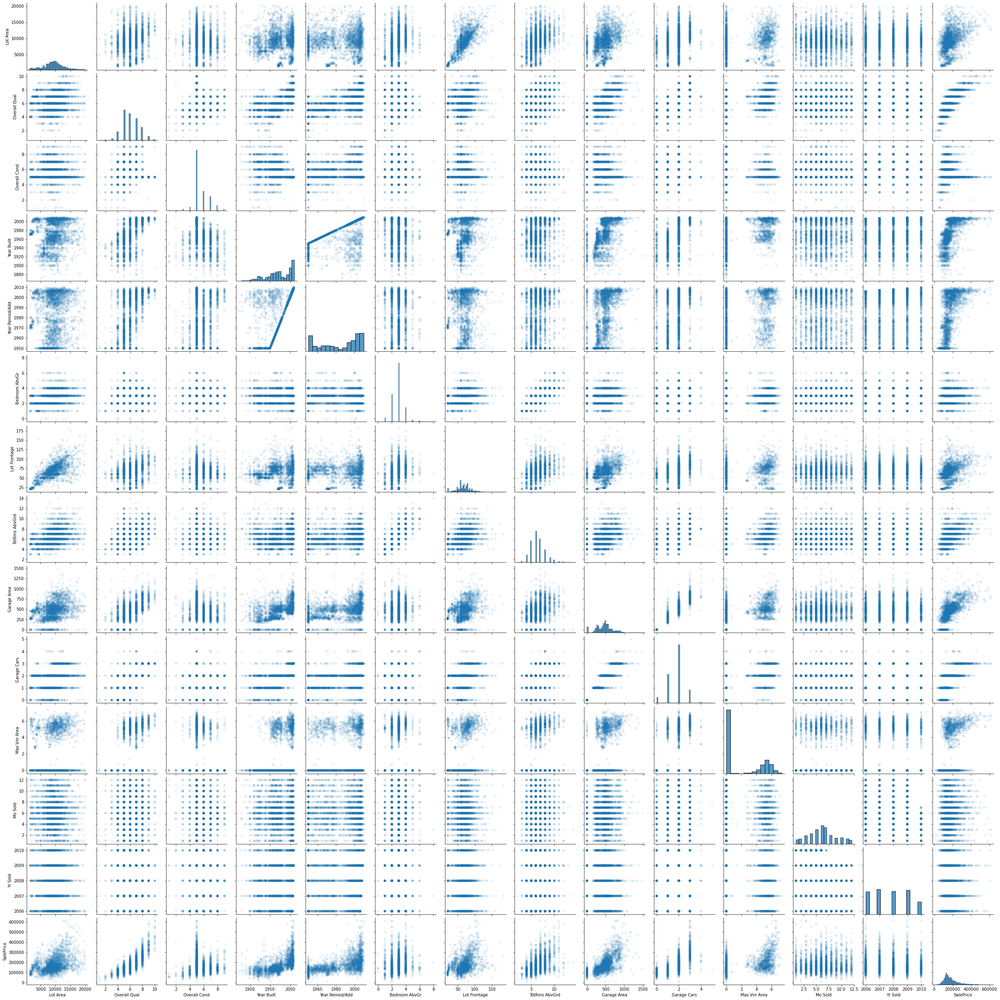

In [23]:
sns.pairplot(labdata, plot_kws=dict(alpha=0.1, edgecolor='none'))

In [27]:
# Polynomial Features

labdata['Overall Qual ^2'] = labdata['Overall Qual'] ** 2
labdata['Garage Area ^2'] = labdata['Garage Area'] ** 2

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/2846491550.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labdata['Overall Qual ^2'] = labdata['Overall Qual'] ** 2
/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/2846491550.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labdata['Garage Area ^2'] = labdata['Garage Area'] ** 2


In [31]:
# Feature Interactions

labdata['Overall Qual * Overall Cond'] = labdata['Overall Qual'] * labdata['Overall Cond']
labdata['Lot Area / TotRms AbvGrd'] = labdata['Lot Area'] / labdata['TotRms AbvGrd']

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/4223616251.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labdata['Overall Qual * Overall Cond'] = labdata['Overall Qual'] * labdata['Overall Cond']
/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/4223616251.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labdata['Lot Area / TotRms AbvGrd'] = labdata['Lot Area'] / labdata['TotRms AbvGrd']


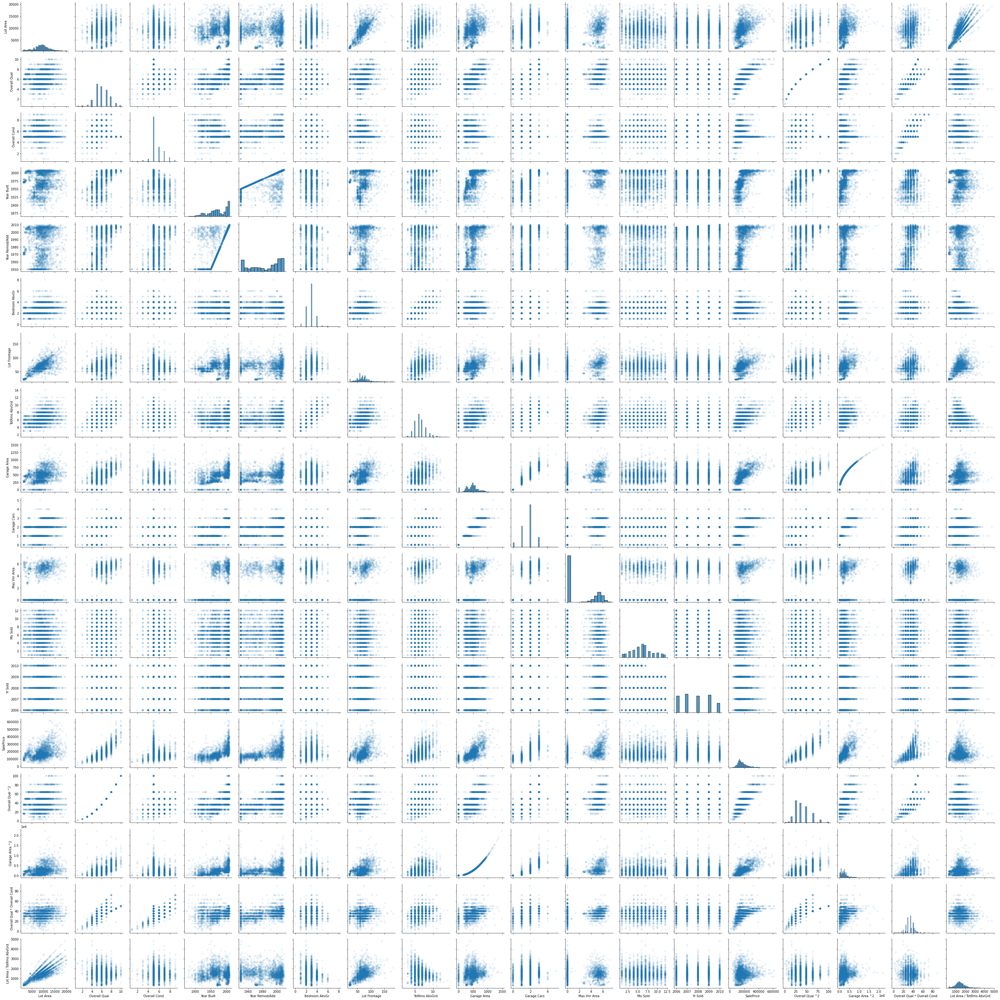

In [34]:
sns.pairplot(labdata, plot_kws=dict(alpha=0.1, edgecolor='none'))

In [24]:
dummydata = labdata.copy()
catg_cols = dummydata.dtypes[dummydata.dtypes == np.object]
catg_cols = catg_cols.index.tolist()
dummydata[catg_cols].head()

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_18064/2769805498.py:2: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  catg_cols = dummydata.dtypes[dummydata.dtypes == np.object]


,Neighborhood,House Style,Garage Type,Sale Type,Sale Condition
1,NAmes,1Story,Attchd,WD,Normal
2,NAmes,1Story,Attchd,WD,Normal
3,NAmes,1Story,Attchd,WD,Normal
4,Gilbert,2Story,Attchd,WD,Normal
5,Gilbert,2Story,Attchd,WD,Normal


In [25]:
dummydata = pd.get_dummies(dummydata, columns=catg_cols, drop_first=True)
dummydata.describe().T

,count,mean,std,min,25%,50%,75%,max
Lot Area,2839.0,9311.600211,3403.105222,1300.0,7345.0,9308.0,11250.0,20000.0
Overall Qual,2839.0,6.088411,1.398782,1.0,5.0,6.0,7.0,10.0
Overall Cond,2839.0,5.569919,1.104139,1.0,5.0,5.0,6.0,9.0
Year Built,2839.0,1971.574146,30.287210,1872.0,1954.0,1974.0,2001.0,2010.0
Year Remod/Add,2839.0,1984.387813,20.846244,1950.0,1966.0,1993.0,2004.0,2010.0
...,...,...,...,...,...,...,...,...
Sale Condition_AdjLand,2839.0,0.004227,0.064888,0.0,0.0,0.0,0.0,1.0
Sale Condition_Alloca,2839.0,0.007749,0.087703,0.0,0.0,0.0,0.0,1.0
Sale Condition_Family,2839.0,0.014794,0.120749,0.0,0.0,0.0,0.0,1.0
Sale Condition_Normal,2839.0,0.825291,0.379785,0.0,1.0,1.0,1.0,1.0


In [35]:
labdata.columns.tolist()

['Lot Area',
 'Neighborhood',
 'House Style',
 'Overall Qual',
 'Overall Cond',
 'Year Built',
 'Year Remod/Add',
 'Bedroom AbvGr',
 'Lot Frontage',
 'TotRms AbvGrd',
 'Garage Type',
 'Garage Area',
 'Garage Cars',
 'Mas Vnr Area',
 'Mo Sold',
 'Yr Sold',
 'Sale Type',
 'Sale Condition',
 'SalePrice',
 'Overall Qual ^2',
 'Garage Area ^2',
 'Overall Qual * Overall Cond',
 'Lot Area / TotRms AbvGrd']

In [42]:
hyp1data = labdata.loc[:,['Overall Qual','Overall Cond',
                          'Overall Qual ^2',
                          'Overall Qual * Overall Cond', 'SalePrice']]
hyp1data.describe().T

,count,mean,std,min,25%,50%,75%,max
Overall Qual,2839.0,6.088411,1.398782,1.0,5.0,6.0,7.0,10.0
Overall Cond,2839.0,5.569919,1.104139,1.0,5.0,5.0,6.0,9.0
Overall Qual ^2,2839.0,39.024657,17.598552,1.0,25.0,36.0,49.0,100.0
Overall Qual * Overall Cond,2839.0,33.747446,9.032592,1.0,30.0,35.0,40.0,90.0
SalePrice,2839.0,178864.190560,77042.992467,12789.0,129000.0,159900.0,211250.0,615000.0


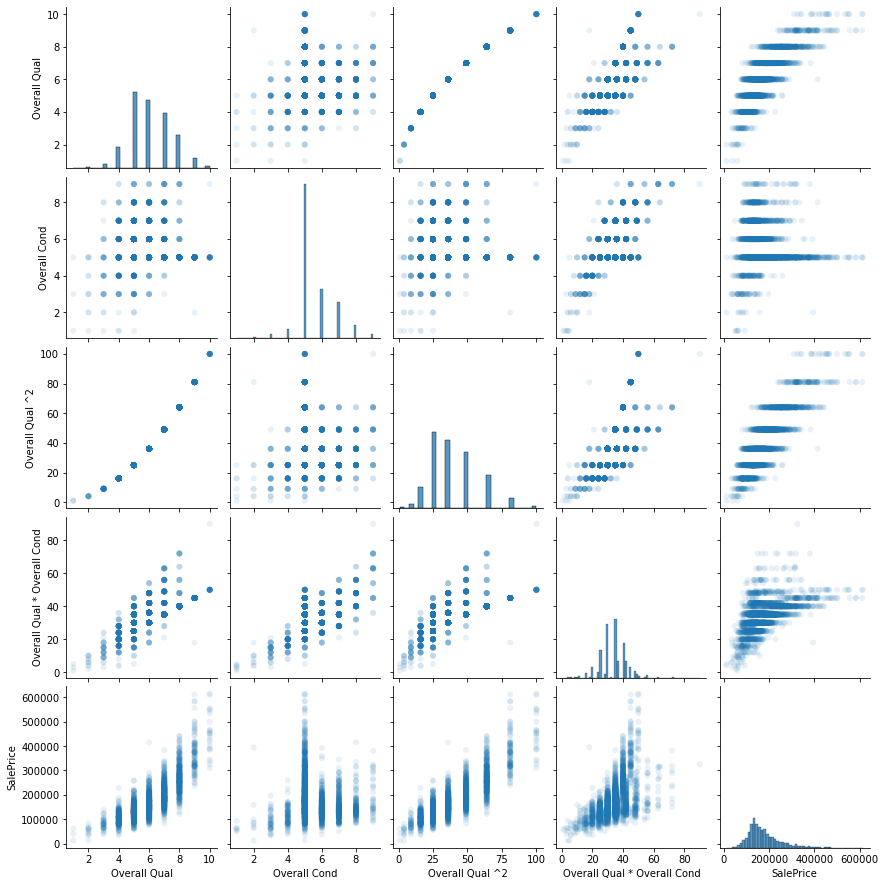

In [43]:
sns.pairplot(hyp1data, plot_kws=dict(alpha=0.1, edgecolor='none'))

In [40]:
hyp2data = labdata.loc[:,['Year Built','Year Remod/Add','SalePrice']]
hyp2data.describe().T

,count,mean,std,min,25%,50%,75%,max
Year Built,2839.0,1971.574146,30.287210,1872.0,1954.0,1974.0,2001.0,2010.0
Year Remod/Add,2839.0,1984.387813,20.846244,1950.0,1966.0,1993.0,2004.0,2010.0
SalePrice,2839.0,178864.190560,77042.992467,12789.0,129000.0,159900.0,211250.0,615000.0


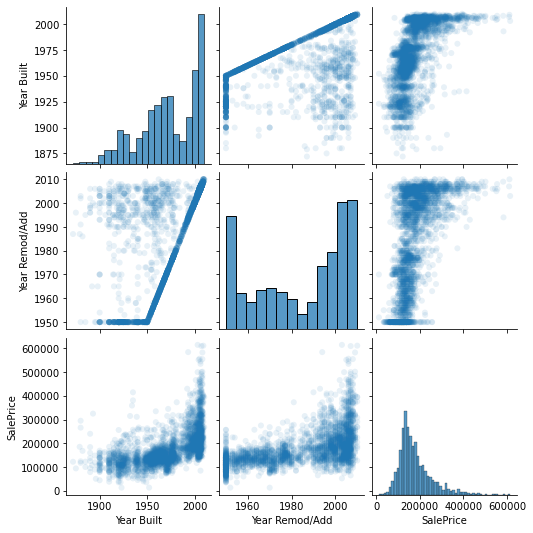

In [41]:
sns.pairplot(hyp2data, plot_kws=dict(alpha=0.1, edgecolor='none'))

In [44]:
hyp3data = labdata.loc[:,['Lot Area','Lot Area / TotRms AbvGrd',
                          'SalePrice']]
hyp3data.describe().T

,count,mean,std,min,25%,50%,75%,max
Lot Area,2839.0,9311.600211,3403.105222,1300.0,7345.000000,9308.0,11250.000,20000.0
Lot Area / TotRms AbvGrd,2839.0,1486.552512,564.698892,240.0,1156.729167,1440.0,1776.125,4784.5
SalePrice,2839.0,178864.190560,77042.992467,12789.0,129000.000000,159900.0,211250.000,615000.0


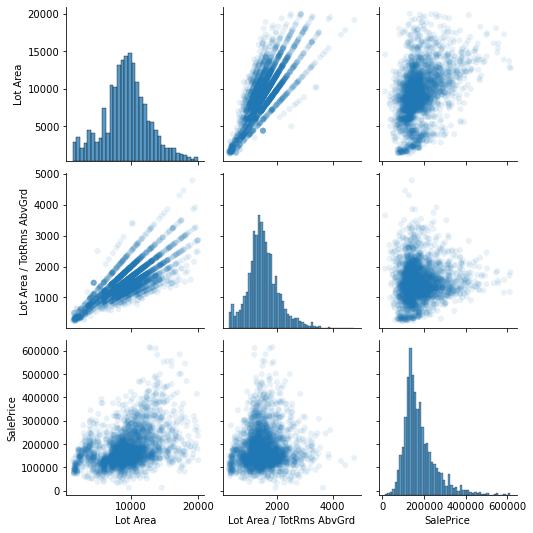

In [45]:
sns.pairplot(hyp3data, plot_kws=dict(alpha=0.1, edgecolor='none'))

<AxesSubplot:>

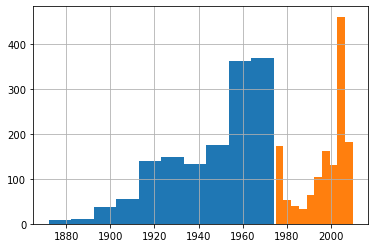

In [116]:
hypdata = labdata.loc[:,['Year Built','SalePrice']]
oldbuilt = hypdata.loc[hypdata['Year Built'] <= hypdata['Year Built'].median(),:]
newbuilt = hypdata.loc[hypdata['Year Built'] > hypdata['Year Built'].median(),:]

oldbuilt['Year Built'].hist()
newbuilt['Year Built'].hist()

In [117]:
oldbuilt.describe().T

,count,mean,std,min,25%,50%,75%,max
Year Built,1436.0,1946.659471,21.237376,1872.0,1929.0,1954.0,1964.00,1974.0
SalePrice,1436.0,135159.616992,41584.039320,12789.0,111000.0,132000.0,153518.75,415000.0


In [118]:
newbuilt.describe().T

,count,mean,std,min,25%,50%,75%,max
Year Built,1403.0,1997.074840,10.425441,1975.0,1992.0,2001.0,2005.0,2010.0
SalePrice,1403.0,223596.740556,79286.923092,75190.0,171500.0,203160.0,260000.0,615000.0


In [119]:
hypdata.describe().T

,count,mean,std,min,25%,50%,75%,max
Year Built,2839.0,1971.574146,30.287210,1872.0,1954.0,1974.0,2001.0,2010.0
SalePrice,2839.0,178864.190560,77042.992467,12789.0,129000.0,159900.0,211250.0,615000.0


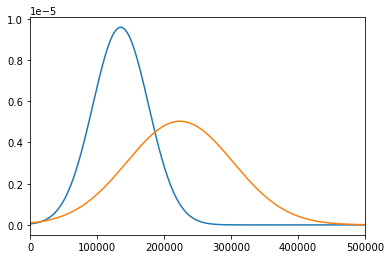

In [131]:
from scipy import stats

mu = 135160
sigma = 41584
x = np.linspace(1,500000,1000)
plt.plot(x,stats.norm.pdf(x,mu,sigma))

mu = 223597
sigma = 79287
x = np.linspace(1,500000,1000)
plt.plot(x,stats.norm.pdf(x,mu,sigma))

#mu = 178864
#sigma = 77043
#x = np.linspace(1,500000,1000)
#plt.plot(x,stats.norm.pdf(x,mu,sigma))

plt.xlim(0,500000)
plt.show()